In [ ]:
!curl -L "https://public.roboflow.com/ds/ASWoiFcRMl?key=MFQtaZeMqP" > roboflow.zip
!unzip roboflow.zip -d ./dataset
!rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1874      0 --:--:-- --:--:-- --:--:--  1870
100 10.2M  100 10.2M    0     0  14.4M      0 --:--:-- --:--:-- --:--:-- 14.4M
Archive:  roboflow.zip
 extracting: ./dataset/README.roboflow.txt  
 extracting: ./dataset/data.yaml     
   creating: ./dataset/test/
   creating: ./dataset/test/images/
 extracting: ./dataset/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg  
 extracting: ./dataset/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg  
 extracting: ./dataset/test/images/b1a50a3824887ee2_jpg.rf.68a4fd34fce20184287592f2680f895b.jpg  
 extracting: ./dataset/test/images/b25d7d2cb7abf86b_jpg.rf.36edce738b0e69965e001035d6f85ab3.jpg  
 extracting: ./dataset/test/images/b32671b7cc279583_jpg.rf.f898026e2169a3b6adc4d21aee6d06c5.jpg  
 extracting: ./dataset/

In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10142, done.
remote: Total 10142 (delta 0), reused 0 (delta 0), pack-reused 10142
Receiving objects: 100% (10142/10142), 10.43 MiB | 25.02 MiB/s, done.
Resolving deltas: 100% (7030/7030), done.


In [ ]:
!mv ./dataset/data.yaml ./yolov5/data

In [ ]:
%cd yolov5
%pip install -qr requirements.txt

import torch
import os
from IPython.display import Image, clear_output

/content/yolov5
     |████████████████████████████████| 596 kB 5.3 MB/s 


In [ ]:
!nvidia-smi

Sun Dec  5 16:40:04 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8    28W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!python train.py --img 416 --batch 16 --epochs 300 --data data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=

In [ ]:
!python val.py --weights runs/train/exp/weights/best.pt --data data.yaml --img 416 --task test

val: data=/content/yolov5/data/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '../dataset/test/labels' images and labels...35 found, 0 missing, 0 empty, 0 corrupted: 100% 35/35 [00:00<00:00, 431.46it/s]
test: New cache created: ../dataset/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:01<00:00,  1.81it/s]
                 all         35        112       0.87      0.787      0.827      0.647
       license-plate         35         45      0.929      0.872       0

In [ ]:
!python val.py --weights runs/train/exp2/weights/best.pt --data data.yaml --img 416 --task test

val: data=/content/yolov5/data/data.yaml, weights=['runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 367 layers, 46113663 parameters, 0 gradients, 107.8 GFLOPs
test: Scanning '../dataset/test/labels.cache' images and labels... 35 found, 0 missing, 0 empty, 0 corrupted: 100% 35/35 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:01<00:00,  1.01it/s]
                 all         35        112      0.922      0.844      0.892       0.73
       license-plate         35         45      0.976      0.911       0.93      0.747
             vehicle         35       

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -R ./runs/train/exp2 ../drive/MyDrive/yolo

In [ ]:
!cp -R ../drive/MyDrive/yolo/exp ./runs/train

In [ ]:
!cp -R ../drive/MyDrive/yolo/exp2 ./runs/train

In [ ]:
!python train.py --img 416 --batch 16 --epochs 600 --data data.yaml --weights yolov5l.pt --cache

train: weights=yolov5l.pt, cfg=, data=data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.5, shear=

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 275), started 0:02:23 ago. (Use '!kill 275' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source ../dataset/test/images --classes 0

detect: weights=['runs/train/exp/weights/best.pt'], source=../dataset/test/images, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=[0], agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/35 /content/dataset/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 416x416 1 license-plate, Done. (0.028s)
image 2/35 /content/dataset/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 416x416 1 license-plate, Done. (0.028s)
image 3/35 /content/dataset/test/images/b1a50a3824887ee2_jpg.rf.68a4fd34fce20184287592f2680f895b.jpg: 416x416 1 

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 416 --conf 0.2 --source ../dataset/test/images --classes 0

detect: weights=['runs/train/exp2/weights/best.pt'], source=../dataset/test/images, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=[0], agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-124-g1075488 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 367 layers, 46113663 parameters, 0 gradients, 107.8 GFLOPs
image 1/35 /content/dataset/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 416x416 1 license-plate, Done. (0.082s)
image 2/35 /content/dataset/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 416x416 1 license-plate, Done. (0.078s)
image 3/35 /content/dataset/test/images/b1a50a3824887ee2_jpg.rf.68a4fd34fce20184287592f2680f895b.jpg: 416x416

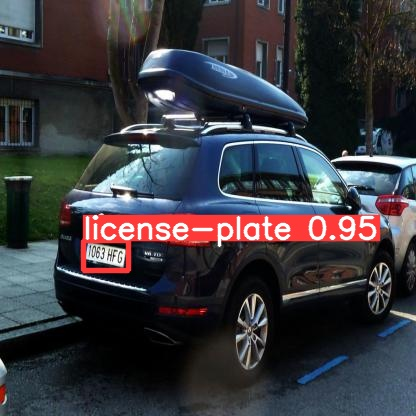

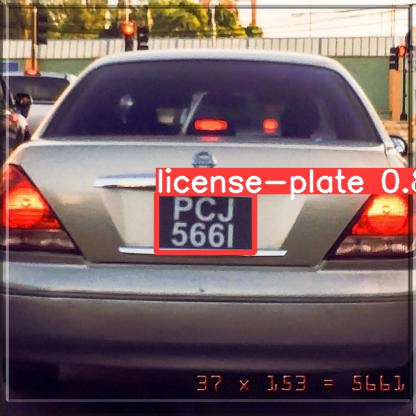

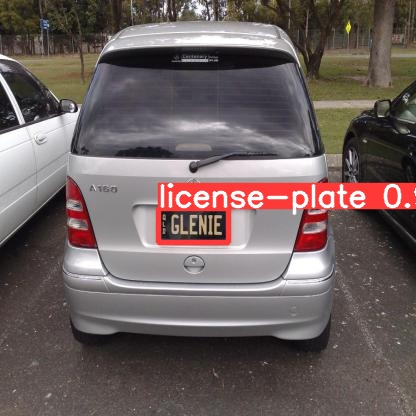

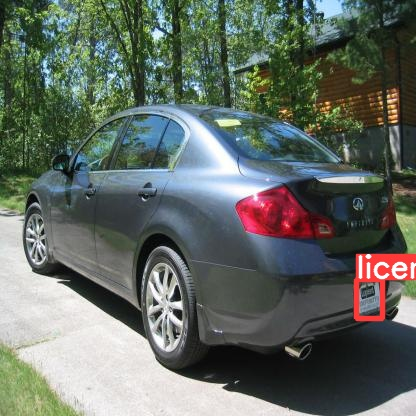

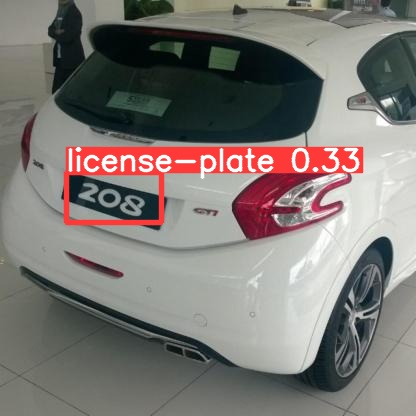

...

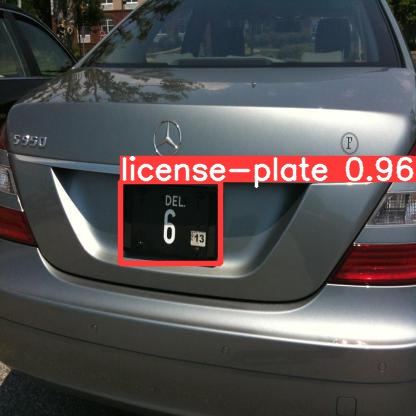

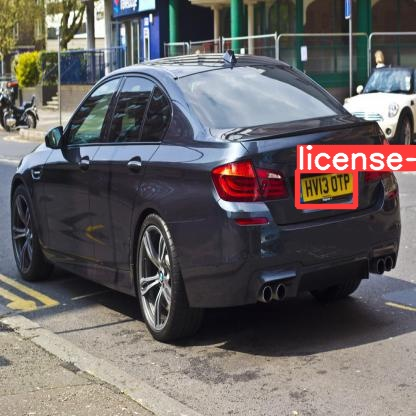

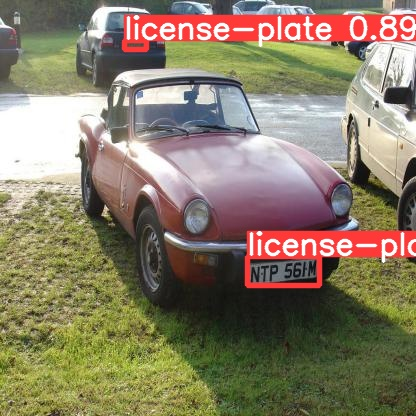

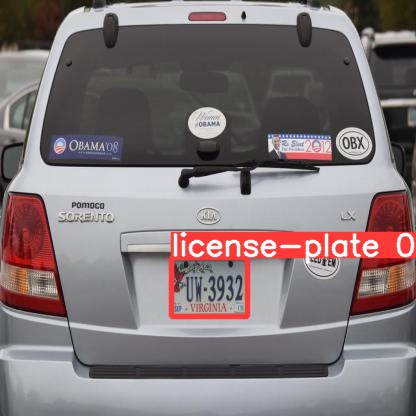

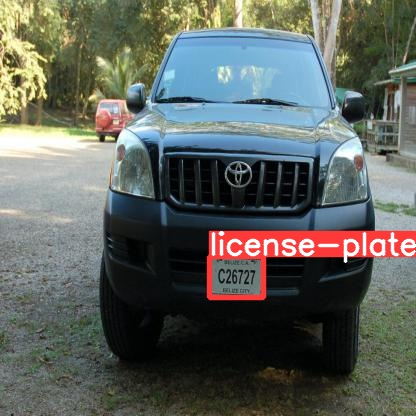

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

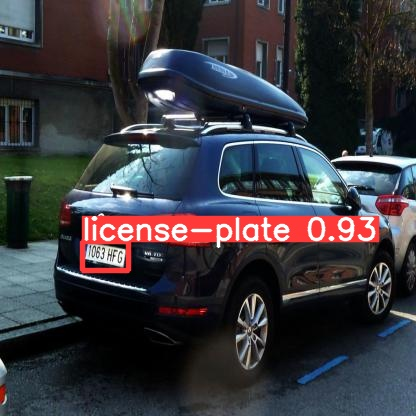

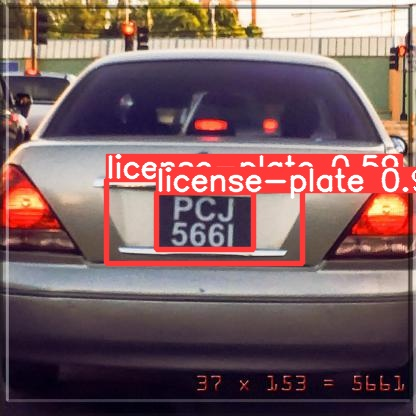

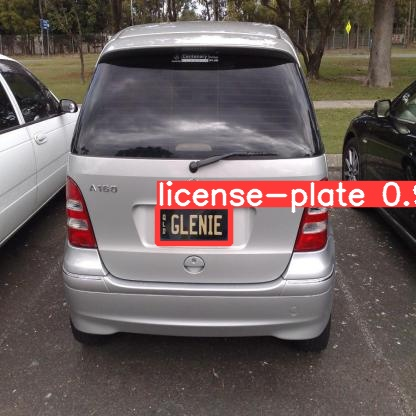

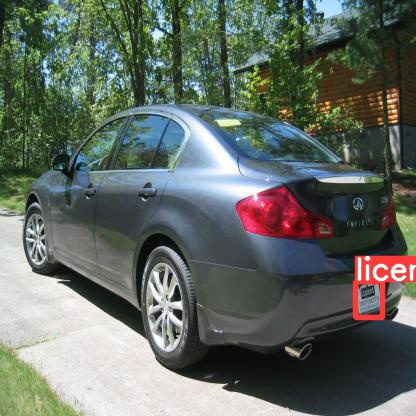

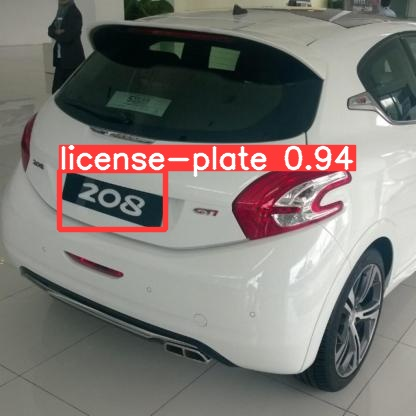

...

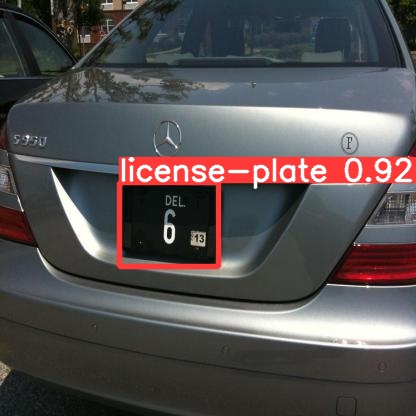

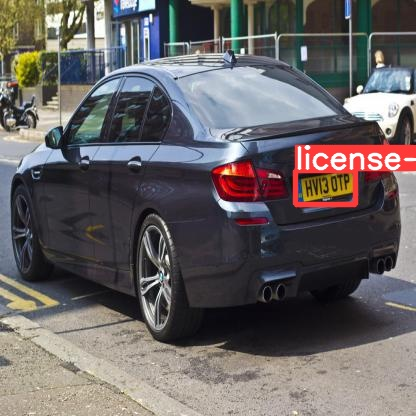

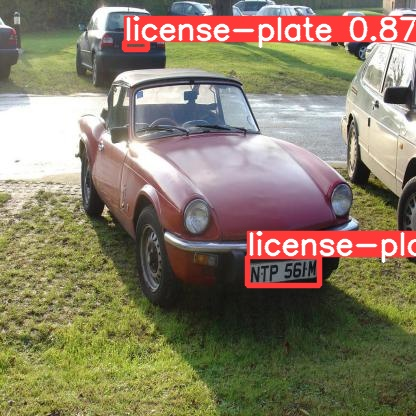

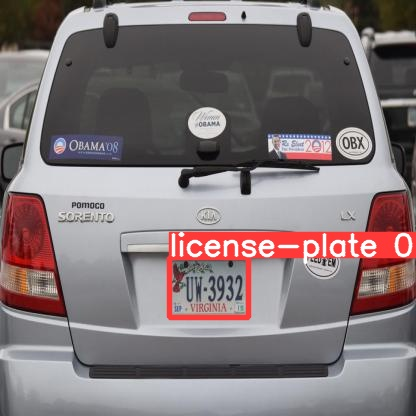

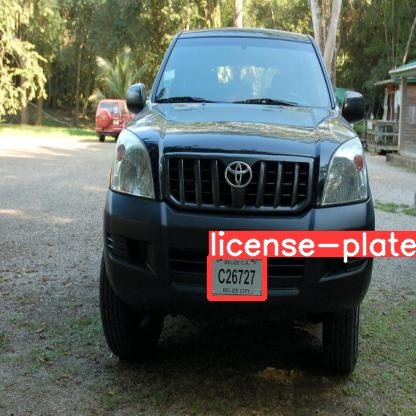

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'):
    display(Image(filename=imageName))
    print("\n")